# KEGGDecoder command line examples and usage

Designed to parse through a KEGG-Koala outputs (including BlastKOALA, GhostKOALA, KofamScan) to determine the completeness of important metabolic pathways. KEGGDecoder is available at: https://github.com/bjtully/BioData/tree/master/KEGGDecoder. Metabolic pathways are hand-curated and with an emphasis on biogeochemical pathways. 
This package facilitates visualization of genome and metagenome assembled genomes metabolic capabilities.

## Possible Outputs

Each run of KEGGDecoder produces two output files, a text file of metabolic pathways and a visualization. The `--output` flag controls denotes the name of the output text file, and its prefix (text prior to `.tsv`) controls the prefix for the output visualization files. The flag `--vizoption` accepts `static`/`interactive`/`tanglegram` and controls the behavior of the function. A description of each output file occurs below.
    
1. A tab-separated text file is generated by KEGGDecoder for all visualizations. The first row (header) contains pathway/process names, and subsequent rows contain submitted samples and fractional percentage of pathway/process. This table is in wide format.
2. The `static` figure output is an SVG file. Each distinct identifier in the input annotation file (e.g. samples) occurs along the y axis of the heatmap, while the each pathway occurs along the x axis. 
3. The `interactive` figure output is an HTML file. Each distinct identifier in the input annotation file (e.g. samples) occurs along the y axis of the heatmap, while the each pathway occurs along the x axis. The html file can be viewed in any browser. Additional information about each cell can be obtained by hovering over a cell with the mouse. Draw a box to zoom in on specific regions.
4. The `tanglegram` figure outputs is an SVG file. In the visualization, the tree on the left hand side is built from euclidean distances between metabolic pathways, while the tree on the right-hand side is a user-supplied newick tree. The auxiliary lines connect samples between the two trees, so the sample names must be the same in both input files. 

## Input file generation and formatting for functional heatmap

The heatmap visualizations of metabolic potential are built from the default output of BlastKOALA, GhostKOALA or KofamScan.

The KEGG-koala programs require amino acid sequences in fasta file format as input. Amino acid sequences from multiple organisms can be in one file. The fasta file headers must contain the sample identifiers, which will be used by KEGG-decoder.py to group annotations by sample.

The input format accepted by KEGGDecoder is a tab-delimited KEGG ortholog assignment file generated by GhostKOALA, BlastKOALA, or KofamScan. The first column records the sample and amino acid sequence ID separated by an underscore, and the second column records the KEGG ortholog ID assigned to the amino acid sequence. This is the simple output table produced by GhostKOALA or KofamScan (more verbose tables exist, however this table is prefiltered and only contains the best match.).

A tutorial for how to run KofamScan can be found [here](https://taylorreiter.github.io/2019-05-11-kofamscan/). MetaSanity also wraps KofamScan, and a tutorial for how to run it can be found [here](https://cjneely10.github.io/posts/2019/10/MetaSanity-Demo-Running-FuncSanity/).

See an example file below.

In [1]:
!head TOBG-MED.TREEMATCH.koalaoutput.txt

TOBG-MED-1001_1
TOBG-MED-1001_2	K02860
TOBG-MED-1001_3	K00554
TOBG-MED-1001_4
TOBG-MED-1001_5	K02014
TOBG-MED-1001_6	K01778
TOBG-MED-1001_7	K02884
TOBG-MED-1001_8	K01083
TOBG-MED-1001_9	K03070
TOBG-MED-1001_10


## Visualizations

We demonstrate the use of KEGGDecoder using microbial sequence data from the Tara Oceans Expedition (https://oceans.taraexpeditions.org). The goal of the Tara expeditions is to predict, anticipate and better manage tomorrow’s climate risks in the global oceans. The research schooner Tara is a floating ocean laboratory that has traveled more than 375,000 kilometers across the ocean collecting data at over 210 sampling stations across 20 biogeographic provinces, collecting over 35,000 samples of seawater and plankton. In this notebook, we use the bins generated by Tully et al. 2018 (DOI:10.1038/sdata.2017.203)

### Static heatmap
    
    !KEGG-decoder --input INPUT.txt --output OUTPUT.tsv --vizoption static
       
This command generates an SVG file (e.g. `OUTPUT.svg`).

In [2]:
!KEGG-decoder --input TOBG-MED.TREEMATCH.koalaoutput.txt --output TOBG-MED-functions.tsv --vizoption static

We use the IPython library to visualize the output file in this notebook. You can also look at this SVG file by opening it in your browser, or with other image-editing software. 

In [3]:
from IPython.display import SVG, display
def show_svg():
    display(SVG('TOBG-MED-functions.svg'))


show_svg()

### Interactive heatmap

The interactive heatmap allows you to hover over each cell to see the sample, the pathway, and the proportion of the pathway that is present in the sample. There are four clustering options: euclidean distance, correlation, descending order of # genes annotated, and ascending order of # genes annotated. These clustering methods are controlled through the a drop down menu in the output figure.
    
```
!KEGG-decoder --input INPUT.txt --output OUTPUT.tsv --vizoption interactive 
```
        
This command generates an SVG file. You can open it in any browser. It will automatically open in the browser in which you are running your jupyter notebook. 

In [4]:
!KEGG-decoder --input TOBG-MED.TREEMATCH.koalaoutput.txt --output TOBG-MED-functions.tsv --vizoption interactive

### Tanglegram

A tanglegram is a plot with two trees opposite one another, with auxiliary lines that connect matching observations in the trees. KEGGDecoder uses the euclidean-distance tree generated from the functional heatmap as one tree, and a newick tree (e.g. built from genomic sequences) supplied by the user. The labels must be the same between the two trees for auxiliary lines to be drawn. This visualization allows the user to compare how relationships between samples built by annotated metabolic pathways compare to relationships between samples derived from gene sequences. 

KEGGDecoder does not build a newick tree. To build a newick tree, you can use a tool like [GToTree](https://github.com/AstrobioMike/GToTree). 

In [5]:
!KEGG-decoder --input TOBG-MED.TREEMATCH.koalaoutput.txt --output TOBG-MED-functions.tsv --vizoption tanglegram --newick GToTree_output.newick

INFO  : Generating linkage from dataframe (tanglegram.tangle)
INFO  : Generating linkage from dataframe (tanglegram.tangle)
Optimising 0.0: 100%|██████████████████████| 1000/1000 [00:09<00:00, 106.43it/s]
INFO  : Finished optimising at entanglement 64.2718 (tanglegram.tangle)
INFO  : Done. Use matplotlib.pyplot.show() to show plot. (tanglegram.tangle)


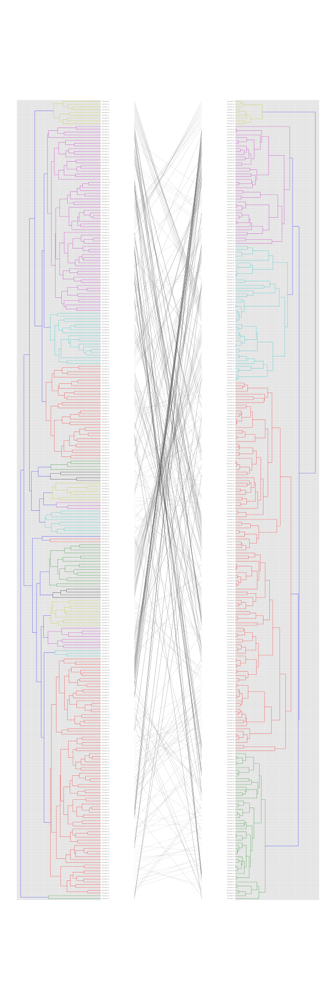

In [6]:
def show_svg():
    display(SVG('TOBG-MED-functions.tanglegram.svg'))

show_svg()